import pandas as pd
# ^^^ pyforest auto-imports - don't write above this line
# Keras Regression

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
# %matplotlib notebook
plt.rcParams["figure.figsize"] = (12,6)
# plt.rcParams['figure.dpi'] = 100
sns.set_style("whitegrid")
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

pd.options.display.max_rows = 100
pd.options.display.max_columns = 100

In [4]:
# !pip install folium 

In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [1]:
#from matplotlib import style
#style.use('dark_background')

In [9]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [10]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [12]:
df.isnull().sum().any()

False

In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### İd_number

In [14]:
df = df.drop('id', axis = 1)

### price

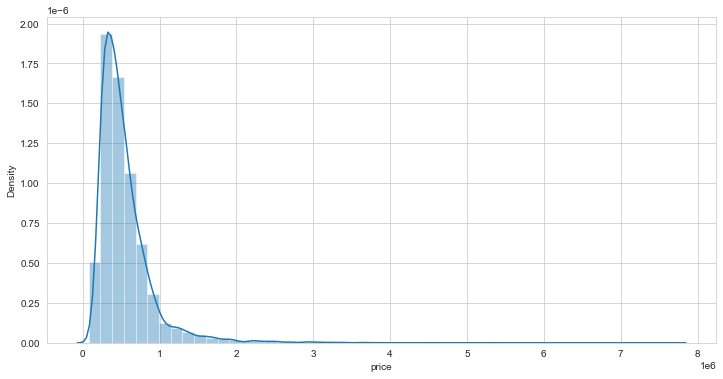

In [15]:
sns.distplot(df['price']);

In [16]:
df[df["price"] > 3000000]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
300,6/24/2014,3080000.000,4,5.000,4550,18641,1.000,1,4,3,10,2600,1950,2002,0,98074,47.605,-122.077,4550,19508
656,11/20/2014,3070000.000,3,2.500,3930,55867,1.000,1,4,4,8,2330,1600,1957,0,98034,47.702,-122.224,2730,26324
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
2083,11/14/2014,3850000.000,4,4.250,5770,21300,2.000,1,4,4,11,5770,0,1980,0,98040,47.585,-122.222,4620,22748
2442,12/10/2014,3280000.000,2,1.750,6840,10000,2.500,1,4,3,11,4350,2490,2001,0,98008,47.604,-122.112,3120,12300
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
2862,11/18/2014,3600000.000,3,3.250,5020,12431,2.000,1,4,3,10,3420,1600,1941,2002,98144,47.593,-122.287,3680,12620
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449


In [17]:
df.groupby("waterfront").mean().T

waterfront,0,1
price,531762.324,1662524.184
bedrooms,3.374,3.301
bathrooms,2.112,2.678
sqft_living,2072.007,3173.687
sqft_lot,15021.290,25371.828
floors,1.493,1.641
view,0.207,3.767
condition,3.409,3.534
grade,7.649,8.773
sqft_above,1783.392,2473.043


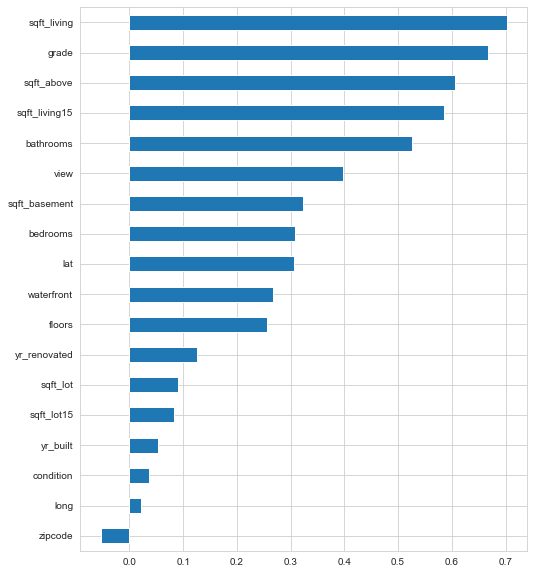

In [18]:
plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");

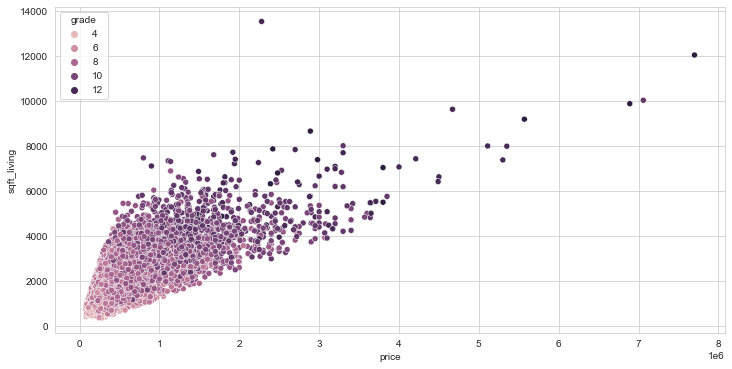

In [19]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");

### bedrooms

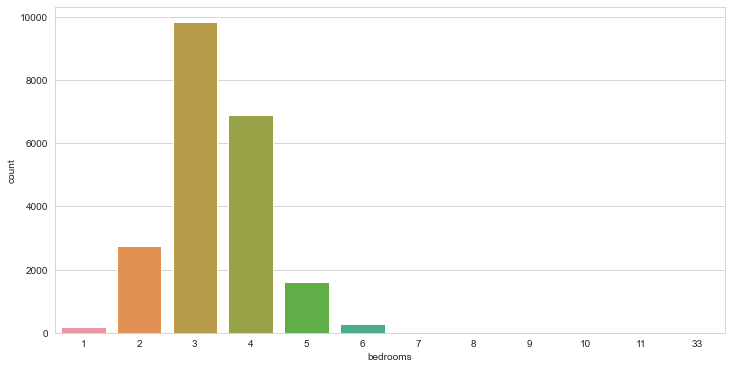

In [20]:
sns.countplot(df['bedrooms']);

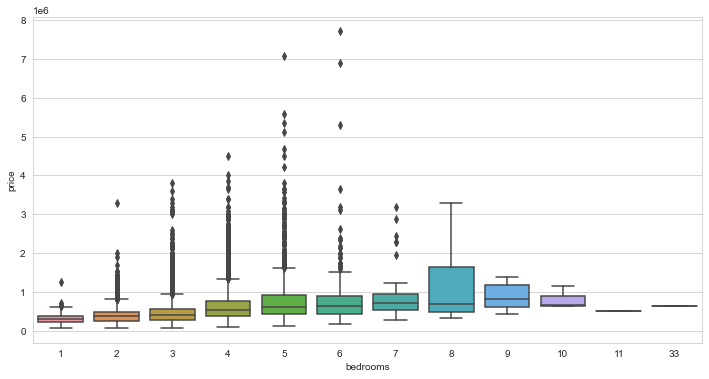

In [21]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [22]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [23]:
df = df[df["bedrooms"] != 33]

Most likely the data was entered incorrectly.

In [24]:
df.shape

(21596, 20)

### date

In [25]:
df['date'].dtype

dtype('O')

In [26]:
df['date'] = pd.to_datetime(df['date'])

In [27]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [28]:
df['year'] = df['date'].apply(lambda date : date.year)

In [29]:
df['month'] = df['date'].apply(lambda date : date.month)

In [30]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


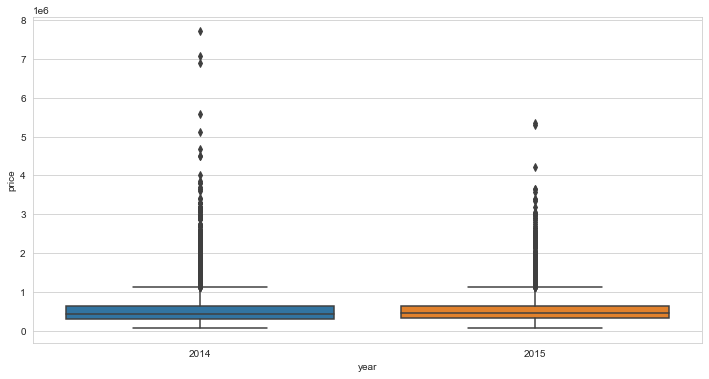

In [31]:
sns.boxplot(x = 'year', y = 'price', data = df);

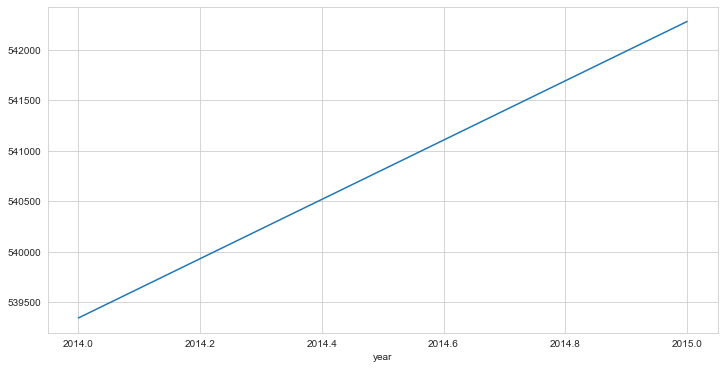

In [32]:
df.groupby('year')['price'].mean().plot();

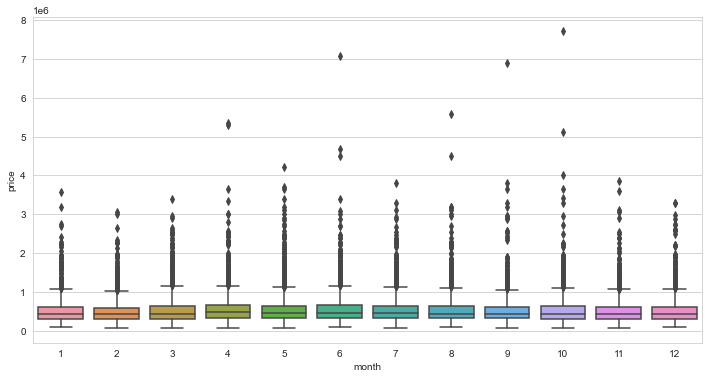

In [33]:
sns.boxplot(x = 'month', y = 'price', data = df);

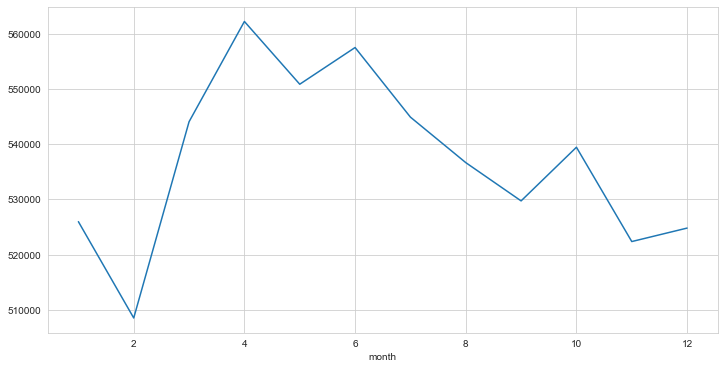

In [34]:
df.groupby('month')['price'].mean().plot();

In [35]:
month_dummy = pd.get_dummies(df["month"], prefix = "month")
df = pd.concat([df, month_dummy], axis = 1)
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10,0,0,0,0,0,0,0,0,0,1,0,0
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2,0,1,0,0,0,0,0,0,0,0,0,0
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2,0,1,0,0,0,0,0,0,0,0,0,0


In [36]:
df = df.drop(['date', "year", "month"], axis = 1)

### zipcode

In [37]:
df['zipcode'].value_counts()

98103    601
98038    589
98115    583
98052    574
98117    553
98042    547
98034    545
98118    507
98023    499
98006    498
98133    493
98059    468
98058    455
98155    446
98074    441
98033    432
98027    412
98125    409
98056    406
98053    403
98001    361
98075    359
98126    354
98092    351
98144    343
98106    335
98116    330
98029    321
98004    317
98199    317
98065    308
98122    290
98146    288
98008    283
98028    283
98040    282
98198    280
98003    280
98031    273
98072    273
98112    269
98168    269
98055    268
98107    266
98136    263
98178    262
98030    256
98177    255
98166    254
98022    233
98105    229
98045    220
98002    199
98077    198
98011    195
98019    190
98108    186
98119    184
98005    168
98007    141
98188    136
98032    125
98014    124
98070    117
98109    109
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [38]:
df = df.drop('zipcode', axis = 1)

### yr_renovated & yr_built

In [36]:
df['yr_renovated'].value_counts()

0       20682
2014       91
2013       37
2003       36
2007       35
2000       35
2005       35
2004       26
1990       25
2006       24
2009       22
2002       22
1989       22
1991       20
1994       19
1993       19
1998       19
2001       19
2010       18
1983       18
2008       18
1984       18
1987       18
1986       17
1985       17
1992       17
1999       17
1995       16
2015       16
1988       15
1996       15
1997       15
2011       13
1980       11
2012       11
1982       11
1979       10
1970        9
1968        8
1977        8
1978        6
1975        6
1964        5
1981        5
1958        5
1965        5
1973        5
1960        4
1972        4
1963        4
1969        4
1976        3
1956        3
1945        3
1957        3
1953        3
1974        3
1955        3
1950        2
1967        2
1971        2
1940        2
1962        2
1946        2
1934        1
1948        1
1954        1
1951        1
1944        1
1959        1
Name: yr_renovated, 

In [39]:
df['yr_built'].value_counts()

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

could make sense due to scaling, higher should correlate to more value

In [38]:
# df["yr_renovated"].replace(0, np.nan, inplace = True)
# df["yr_renovated"].fillna(df["yr_built"], inplace = True)
# df.drop("yr_built", axis = 1, inplace = True)

In [39]:
# df["yr_renovated"].replace(0, np.nan, inplace = True)
# df["yr_renovated"].fillna(df["yr_built"], inplace = True)
# df["new_age"] = 2021 - df["yr_renovated"]
# df.drop(["yr_renovated", "yr_built"], axis = 1, inplace = True)

### sqft_basement

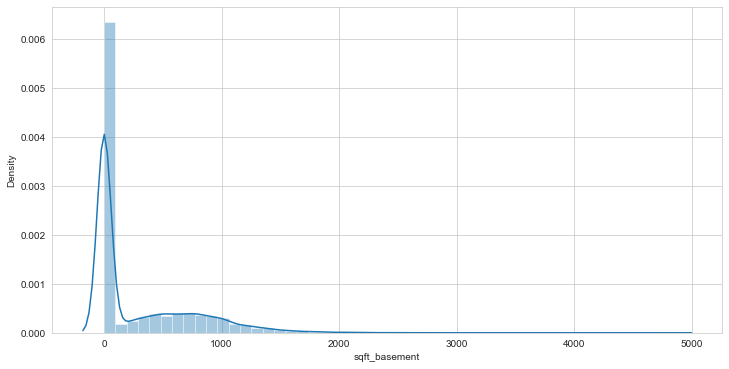

In [40]:
sns.distplot(df['sqft_basement']);

In [41]:
df['sqft_basement'].value_counts()

0       13110
600       221
700       218
500       214
800       206
        ...  
65          1
1248        1
172         1
1920        1
1135        1
Name: sqft_basement, Length: 306, dtype: int64

In [42]:
df[df["sqft_basement"] > 3000]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,47.557,-122.210,3270,10454,0,0,0,0,0,1,0,0,0,0,0,0
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,1980,0,47.576,-122.242,4480,16471,0,0,0,0,0,0,0,0,1,0,0,0
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,1991,0,47.593,-122.086,4913,14663,0,0,0,0,0,0,0,1,0,0,0,0


could make sense due to scaling, higher should correlate to more value

### sqft_above

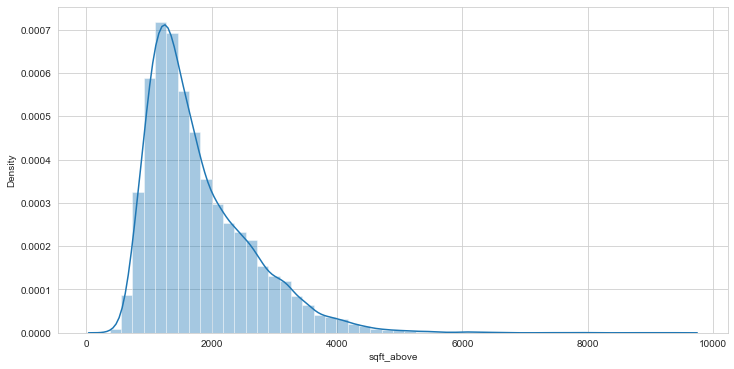

In [43]:
sns.distplot(df['sqft_above']);

In [44]:
df['sqft_above'].value_counts()

1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
2198      1
6420      1
2406      1
2502      1
2031      1
Name: sqft_above, Length: 942, dtype: int64

In [45]:
df[df["sqft_above"] > 6000]

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
419,1550000.000,5,4.250,6070,171626,2.000,0,0,3,12,6070,0,1999,0,47.595,-121.950,4680,211267,0,0,0,0,0,0,1,0,0,0,0,0
527,1600000.000,6,5.000,6050,230652,2.000,0,3,3,11,6050,0,2001,0,47.603,-121.943,4210,233971,0,0,0,0,0,1,0,0,0,0,0,0
1099,1570000.000,5,4.500,6070,14731,2.000,0,0,3,11,6070,0,2004,0,47.531,-122.134,4750,13404,0,0,0,0,0,0,0,0,0,0,1,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
2624,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,47.749,-122.280,3030,23408,0,0,0,0,0,0,0,1,0,0,0,0
3118,1320000.000,4,5.250,6110,10369,2.000,0,0,3,11,6110,0,2005,0,47.529,-122.135,4190,10762,0,0,0,0,0,0,0,0,0,0,1,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
4807,2480000.000,5,3.750,6810,7500,2.500,0,0,3,13,6110,700,1922,0,47.629,-122.322,2660,7500,0,0,1,0,0,0,0,0,0,0,0,0
6495,1940000.000,4,5.750,7220,223462,2.000,0,4,3,12,6220,1000,2000,0,47.710,-122.013,2680,7593,0,1,0,0,0,0,0,0,0,0,0,0


### Geographical Properties

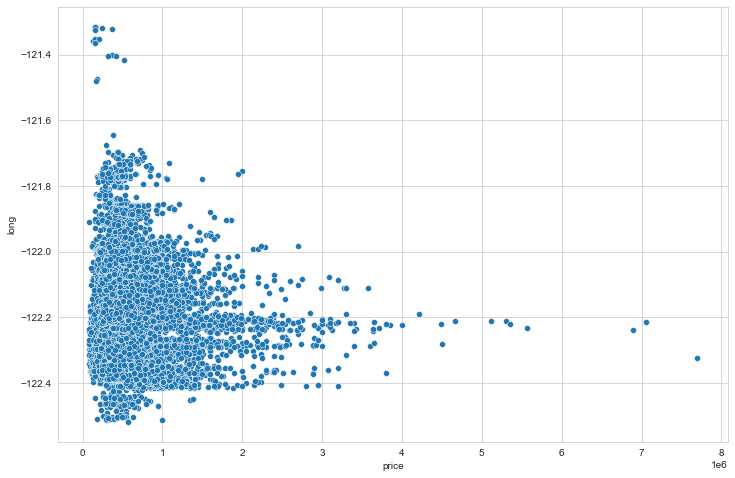

In [47]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

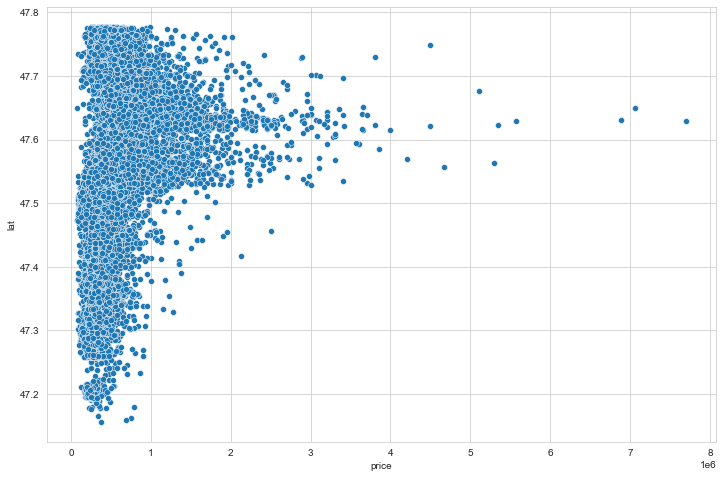

In [49]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

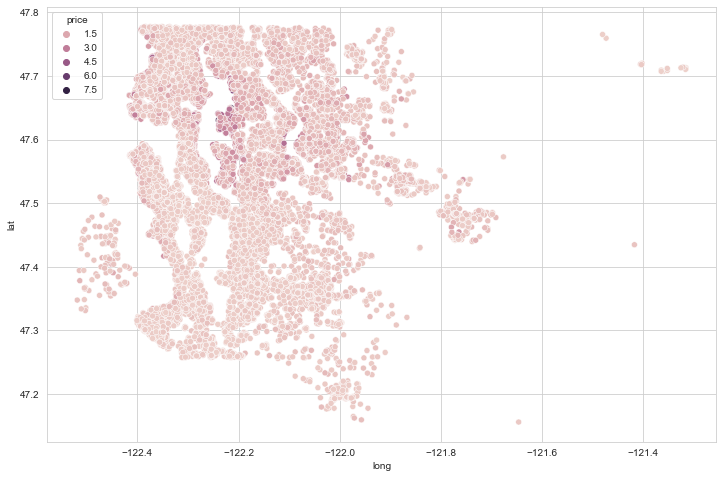

In [50]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

In [51]:
len(df) * (0.01)

215.96

In [52]:
df.sort_values('price', ascending = False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,2007,0,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,1990,0,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,2007,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,1951,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0


In [53]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]

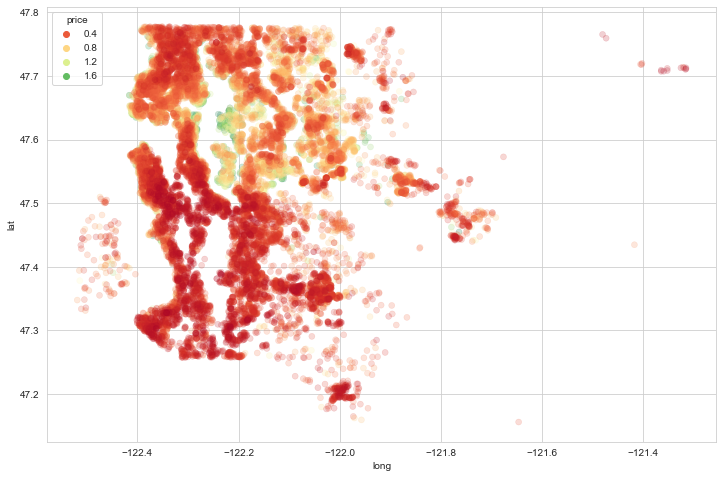

In [54]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

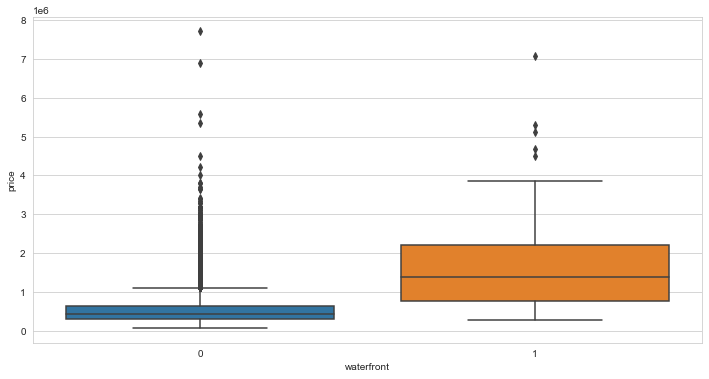

In [55]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

In [57]:
import folium
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [58]:
map_kc = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10) # location=[47.511,  -122.257]
for lat, lng in zip(df['lat'], df['long']):
    folium.CircleMarker(
        [lat, lng],
        radius = 1,
        color = 'blue',
        fill = False ,
        fill_color ='#3186CC',
        fill_opacity = 0.3).add_to(map_kc)
map_kc

### latest data

In [56]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,1
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1,0,0,0,0,0,0,0,0,0,0


In [59]:
df.shape

(21596, 30)

## Preprocessing of Data
- Train | Test Split, Scalling

In [60]:
from sklearn.model_selection import train_test_split

In [61]:
X = df.drop('price', axis = 1)
y = df['price']

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=101)

In [97]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [98]:
scaler = MinMaxScaler()

In [99]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [100]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [101]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score

In [102]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [103]:
X_train.shape

(19436, 29)

In [104]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam', loss = 'mae')

In [105]:
model.weights

[<tf.Variable 'dense_15/kernel:0' shape=(29, 19) dtype=float32, numpy=
 array([[-0.32606798, -0.17392959, -0.17911576,  0.14337549, -0.27733243,
         -0.03142571,  0.25791958,  0.29444364,  0.2165375 , -0.03579009,
          0.04011115,  0.18201563,  0.26213828,  0.3469452 ,  0.25999925,
          0.26766387, -0.14604911,  0.02031359, -0.35141233],
        [-0.08637574,  0.19801447, -0.22634189,  0.2209566 , -0.02788115,
          0.08294711, -0.29357725, -0.08834231, -0.12253791, -0.09434015,
         -0.28993255, -0.23335353,  0.10323995,  0.2116209 , -0.30310994,
         -0.00702301,  0.24828884, -0.28004566,  0.31504878],
        [ 0.14172864,  0.00602287, -0.17446898, -0.11814789, -0.28657186,
         -0.19506565,  0.32207438, -0.03231567, -0.26266885,  0.24148789,
         -0.24029738,  0.30273905,  0.22203025, -0.24698044, -0.10768536,
          0.0391846 ,  0.16739634, -0.0692423 , -0.2256254 ],
        [-0.11495848, -0.10541694,  0.13244992, -0.0550715 , -0.18675159,
   

In [106]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 0s 998us/step - loss: 542112.0625 - val_loss: 531742.4375
Epoch 2/1000
130/130 [==============================] - 0s 564us/step - loss: 539961.2500 - val_loss: 524181.1562
Epoch 3/1000
130/130 [==============================] - 0s 564us/step - loss: 510132.7500 - val_loss: 454495.4688
Epoch 4/1000
130/130 [==============================] - 0s 572us/step - loss: 354065.9688 - val_loss: 209052.0000
Epoch 5/1000
130/130 [==============================] - 0s 557us/step - loss: 192935.8125 - val_loss: 181748.9688
Epoch 6/1000
130/130 [==============================] - 0s 557us/step - loss: 186312.1719 - val_loss: 180049.5469
Epoch 7/1000
130/130 [==============================] - 0s 595us/step - loss: 184343.6250 - val_loss: 178456.8281
Epoch 8/1000
130/130 [==============================] - 0s 558us/step - loss: 182386.9219 - val_loss: 176637.5469
Epoch 9/1000
130/130 [==============================] - 0s 557us/step - loss: 180293.828

In [107]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_15 (Dense)             (None, 19)                570       
_________________________________________________________________
dense_16 (Dense)             (None, 19)                380       
_________________________________________________________________
dense_17 (Dense)             (None, 19)                380       
_________________________________________________________________
dense_18 (Dense)             (None, 19)                380       
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 20        
Total params: 1,730
Trainable params: 1,730
Non-trainable params: 0
_________________________________________________________________


In [108]:
model.weights

[<tf.Variable 'dense_15/kernel:0' shape=(29, 19) dtype=float32, numpy=
 array([[-3.51005554e-01, -7.75011003e-01, -1.39718711e+00,
          8.89223590e-02, -3.50755125e-01, -7.54379272e-01,
          3.36896569e-01,  2.52880543e-01,  2.10744247e-01,
         -1.06539406e-01, -3.75021398e-02,  1.62962615e-01,
          2.46753559e-01,  5.68074346e-01, -3.69376212e-01,
          2.28534147e-01, -1.57654375e-01, -3.77249926e-01,
         -7.76099026e-01],
        [ 6.17129743e-01,  3.19566846e+00,  3.13348627e+00,
          9.03977275e-01,  6.52569234e-01,  8.35375071e-01,
         -6.22002184e-01,  6.11631274e-01,  5.66921771e-01,
          5.88556111e-01,  3.91842812e-01,  4.65753078e-01,
          8.11059654e-01,  5.53232968e-01,  4.88207877e-01,
         -4.54064012e-02,  9.43479836e-01,  3.93173218e-01,
          7.95162082e-01],
        [ 2.52541232e+00,  2.75437713e+00,  3.51932120e+00,
          2.24739194e+00,  2.10207558e+00,  1.29393458e+00,
          5.38006285e-03,  2.357985

In [109]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,542112.062,531742.438
1,539961.250,524181.156
2,510132.750,454495.469
3,354065.969,209052.000
4,192935.812,181748.969
...,...,...
995,98561.812,99368.625
996,98561.320,98991.836
997,98576.289,99574.156
998,98563.359,98971.570


<AxesSubplot:>

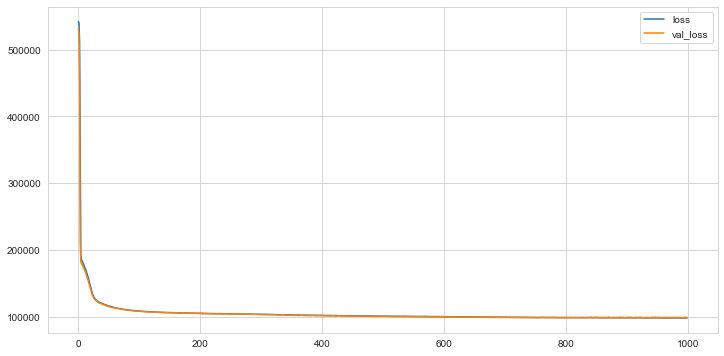

In [110]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [111]:
model.evaluate(X_test, y_test, verbose=0)

91951.9453125

In [112]:
y_pred = model.predict(X_test)

In [113]:
eval_metric(y_test, y_pred)

r2_score: 0.8196064590452677 
mae: 91951.93773871528 
mse: 23176919196.86265 
rmse: 152239.67681541713


### learning_rate

In [114]:
from tensorflow.keras.optimizers import Adam

In [117]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mae')

In [118]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 0s 981us/step - loss: 539514.1875 - val_loss: 510425.0625
Epoch 2/1000
130/130 [==============================] - 0s 572us/step - loss: 313567.3438 - val_loss: 180818.7500
Epoch 3/1000
130/130 [==============================] - 0s 564us/step - loss: 183582.0625 - val_loss: 175890.9219
Epoch 4/1000
130/130 [==============================] - 0s 564us/step - loss: 177308.3906 - val_loss: 170104.4219
Epoch 5/1000
130/130 [==============================] - 0s 564us/step - loss: 170683.7500 - val_loss: 163326.1562
Epoch 6/1000
130/130 [==============================] - 0s 555us/step - loss: 163148.0156 - val_loss: 155702.2500
Epoch 7/1000
130/130 [==============================] - 0s 561us/step - loss: 154414.5781 - val_loss: 146736.9062
Epoch 8/1000
130/130 [==============================] - 0s 564us/step - loss: 144257.8281 - val_loss: 137259.2656
Epoch 9/1000
130/130 [==============================] - 0s 572us/step - loss: 135287.375

<AxesSubplot:>

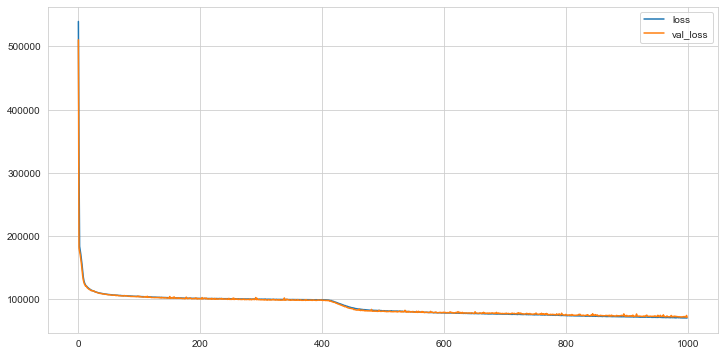

In [119]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [120]:
y_pred = model.predict(X_test)

In [121]:
eval_metric(y_test, y_pred)

r2_score: 0.9033634134024864 
mae: 67185.5406141493 
mse: 12415845640.46687 
rmse: 111426.41356728156


### EarlyStopping

In [122]:
from tensorflow.keras.callbacks import EarlyStopping

In [135]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mae')

In [136]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [137]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 0s 993us/step - loss: 539741.3750 - val_loss: 512844.1250
Epoch 2/1000
130/130 [==============================] - 0s 564us/step - loss: 324921.9375 - val_loss: 181541.9688
Epoch 3/1000
130/130 [==============================] - 0s 564us/step - loss: 184068.8438 - val_loss: 178344.7031
Epoch 4/1000
130/130 [==============================] - 0s 580us/step - loss: 178317.1406 - val_loss: 170826.3281
Epoch 5/1000
130/130 [==============================] - 0s 564us/step - loss: 172075.5312 - val_loss: 165447.6875
Epoch 6/1000
130/130 [==============================] - 0s 557us/step - loss: 165181.0156 - val_loss: 158043.8594
Epoch 7/1000
130/130 [==============================] - 0s 557us/step - loss: 157155.5781 - val_loss: 149978.4219
Epoch 8/1000
130/130 [==============================] - 0s 557us/step - loss: 147685.0469 - val_loss: 140483.1875
Epoch 9/1000
130/130 [==============================] - 0s 557us/step - loss: 138159.625

<AxesSubplot:>

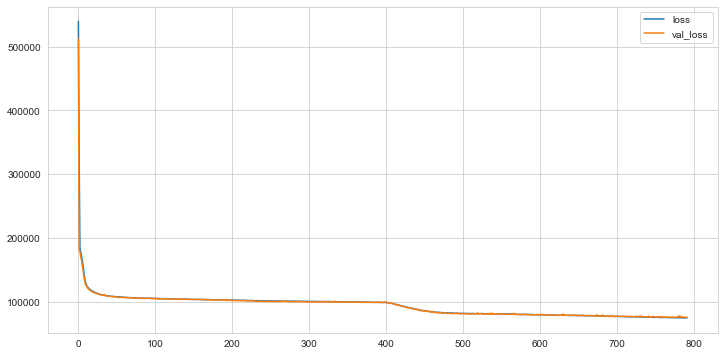

In [138]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [139]:
y_pred = model.predict(X_test)

In [140]:
eval_metric(y_test, y_pred)

r2_score: 0.8868815988804502 
mae: 71263.51936487269 
mse: 14533425246.550264 
rmse: 120554.65667716973


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [141]:
from tensorflow.keras.layers import Dropout

In [148]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(19, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mae')

In [149]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [150]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 0s 1ms/step - loss: 536162.3125 - val_loss: 481396.1875
Epoch 2/1000
130/130 [==============================] - 0s 765us/step - loss: 273915.4062 - val_loss: 179592.5000
Epoch 3/1000
130/130 [==============================] - 0s 781us/step - loss: 208959.5469 - val_loss: 173599.6875
Epoch 4/1000
130/130 [==============================] - 0s 781us/step - loss: 204195.9375 - val_loss: 167328.4531
Epoch 5/1000
130/130 [==============================] - 0s 781us/step - loss: 198288.4844 - val_loss: 159988.0312
Epoch 6/1000
130/130 [==============================] - 0s 770us/step - loss: 190471.6406 - val_loss: 151611.8594
Epoch 7/1000
130/130 [==============================] - 0s 781us/step - loss: 183194.3438 - val_loss: 142451.0938
Epoch 8/1000
130/130 [==============================] - 0s 781us/step - loss: 175669.1719 - val_loss: 134874.3750
Epoch 9/1000
130/130 [==============================] - 0s 777us/step - loss: 171246.0312 

<AxesSubplot:>

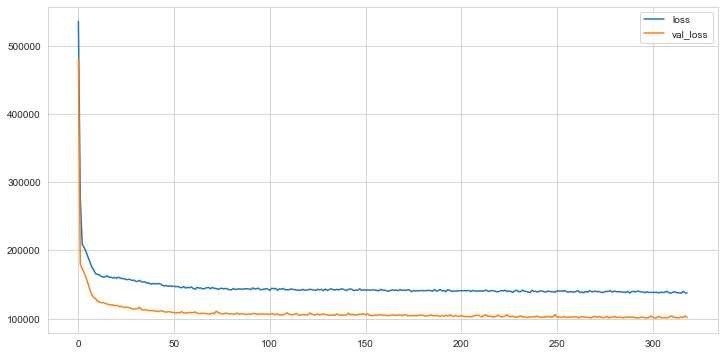

In [151]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [152]:
y_pred = model.predict(X_test)

In [153]:
eval_metric(y_test, y_pred)

r2_score: 0.8091505933999207 
mae: 95458.05554108796 
mse: 24520286325.823612 
rmse: 156589.54730703967


## Saving Final Model and Scaler

In [154]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

In [155]:
model = Sequential()

model.add(Dense(19, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(19, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mae')

In [156]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1000)

Epoch 1/1000
152/152 [==============================] - 0s 912us/step - loss: 527438.1250 - val_loss: 439467.0625
Epoch 2/1000
152/152 [==============================] - 0s 535us/step - loss: 223824.2656 - val_loss: 178595.2500
Epoch 3/1000
152/152 [==============================] - 0s 535us/step - loss: 178652.7500 - val_loss: 170306.2188
Epoch 4/1000
152/152 [==============================] - 0s 542us/step - loss: 170181.8281 - val_loss: 160822.4219
Epoch 5/1000
152/152 [==============================] - 0s 542us/step - loss: 160051.6250 - val_loss: 148555.4062
Epoch 6/1000
152/152 [==============================] - 0s 532us/step - loss: 147153.3750 - val_loss: 134877.4375
Epoch 7/1000
152/152 [==============================] - 0s 538us/step - loss: 134812.8125 - val_loss: 125835.3750
Epoch 8/1000
152/152 [==============================] - 0s 542us/step - loss: 127583.6484 - val_loss: 121498.4609
Epoch 9/1000
152/152 [==============================] - 0s 535us/step - loss: 123770.601

<AxesSubplot:>

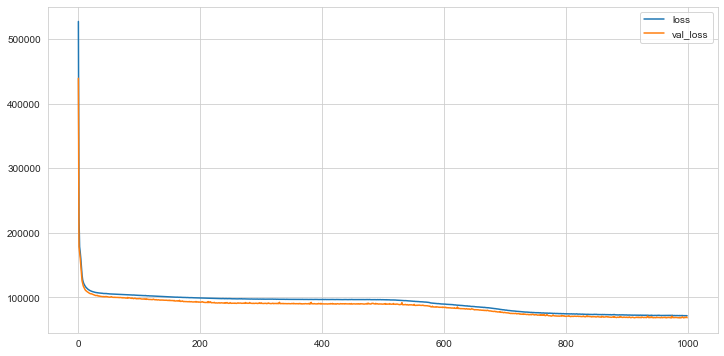

In [157]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [158]:
y_pred = model.predict(X_test)

In [159]:
eval_metric(y_test, y_pred)

r2_score: 0.8949276324712039 
mae: 68568.55134910301 
mse: 13499672766.271954 
rmse: 116188.09218793445


In [160]:
model.save('model_kc_house.h5')  # creates a HDF5 file 'my_model.h5'

## Loading Model and Scaler

In [162]:
from tensorflow.keras.models import load_model

In [163]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [168]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0


In [169]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.47826087, 0.        , 0.57149751, 0.21760797,
        0.15304348, 0.00573322, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 1.        , 0.        , 0.        ]])

In [170]:
model_kc_house.predict(single_house)

array([[232579.19]], dtype=float32)

In [171]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [172]:
from sklearn.linear_model import LinearRegression 

In [178]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7168439905813017 
mae: 122192.94755096173 
mse: 36379816681.1864 
rmse: 190734.93828133954


### Random Forest

In [175]:
from sklearn.ensemble import RandomForestRegressor

In [177]:
rf_model = RandomForestRegressor(random_state = 101)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8886293030442941 
mae: 64785.36375462963 
mse: 14308880631.643038 
rmse: 119619.73345415479
